In [1]:
import torch
from torch import nn
from torch import optim
from torch.autograd import Variable
import torchvision

# Define the Generator and Discriminator Newtorks

In [2]:
# All networks should inherit `nn.Module`
class Generator(nn.Module):
    """
    Takes a 100 element input vector and transforms
    it into an image with dimensions 64x64
    
    input is bacth_size x n_ch x width x height.
    In this case, (batch_size, 100, 1, 1)
    """
    
    # Note on convolutional transpose operations:
    # Input: (batch, chs_in, h_in, w_in)
    # Output: (batch, chs_out, h_out, w_out)
    # h_out = (h_in-1) * stride - 2 * padding + kernel
    
    # Anything with optimizable parameters needs to be
    # setup within the init method
    def __init__(self):
        super(Generator, self).__init__()
        self.main = nn.Sequential(
            
            # Hidden Layer 1
            nn.ConvTranspose2d(in_channels=100, 
                               out_channels=512,
                               kernel_size=4,
                               stride=1,
                               padding=0,
                               bias=False),
            nn.BatchNorm2d(num_features=512),
            nn.ReLU(),
            
            # Hidden Layer 2
            nn.ConvTranspose2d(in_channels=512,
                               out_channels=256,
                               kernel_size=4,
                               stride=2,
                               padding=1,
                               bias=False),
            nn.BatchNorm2d(num_features=256),
            nn.ReLU(),
            
            # Hidden Layer 3
            nn.ConvTranspose2d(in_channels=256,
                               out_channels=128,
                               kernel_size=4,
                               stride=2,
                               padding=1,
                               bias=False),
            nn.BatchNorm2d(num_features=128),
            nn.ReLU(),
            
            # Hidden Layer 4
            nn.ConvTranspose2d(in_channels=128,
                               out_channels=64,
                               kernel_size=4,
                               stride=2,
                               padding=1,
                               bias=False),
            nn.BatchNorm2d(num_features=64),
            nn.ReLU(),
            
            # Hidden Layer 5
            nn.ConvTranspose2d(in_channels=64,
                               out_channels=32,
                               kernel_size=4,
                               stride=2,
                               padding=1,
                               bias=False),
            nn.BatchNorm2d(num_features=32),
            nn.ReLU(),
            
             # Hidden Layer 6
            nn.ConvTranspose2d(in_channels=32,
                               out_channels=16,
                               kernel_size=4,
                               stride=2,
                               padding=1,
                               bias=False),
            nn.BatchNorm2d(num_features=16),
            nn.ReLU(),
            
            # Output Layer
            nn.ConvTranspose2d(in_channels=16, 
                               out_channels=1,
                               kernel_size=4,
                               stride=2,
                               padding=1,
                               bias=False),
            nn.Tanh()
        )
        
    # All modules must override `forward`
    def forward(self, x):
        x = self.main(x)
        return x

In [3]:
# Confirm the generator creates an image when given noise
# Map from (batch, 100, 1, 1) to (batch, 1, 32, 32)
G = Generator()
G(torch.randn(12, 100, 1, 1)).shape

torch.Size([12, 1, 256, 256])

In [4]:
class Discriminator(nn.Module):
    """
    Takes in a 32x32 image and produces a decision
    about if that image is genuine or generated.
    
    Input is (bacth_size x n_ch x width x height)
    In this case (100, 1, 64, 64)
    """
    
    def __init__(self):
        super(Discriminator, self).__init__()
        
        # input is 1ch x 64w x 64h
        # nn.Conv2d(in_channels, out_channels, kernel_size, stride, padding)
        self.main = nn.Sequential(
            nn.Conv2d(in_channels=1,
                      out_channels=16,
                      kernel_size=4,
                      stride=2,
                      padding=1, 
                      bias=False),
            nn.LeakyReLU(negative_slope=0.2),
            
            # (batch_size, 1, 64, 64)
            nn.Conv2d(in_channels=16,
                      out_channels=32,
                      kernel_size=4,
                      stride=2,
                      padding=1, 
                      bias=False),
            nn.LeakyReLU(negative_slope=0.2),
            
            # (batch_size, 64, 32, 32)
            nn.Conv2d(in_channels=32,
                      out_channels=64,
                      kernel_size=4,
                      stride=2,
                      padding=1,
                      bias=False),
            nn.BatchNorm2d(num_features=64),
            nn.LeakyReLU(negative_slope=0.2),
            
            # (batch_size, 128, 16, 16)
            nn.Conv2d(in_channels=64,
                      out_channels=128,
                      kernel_size=4,
                      stride=2,
                      padding=1,
                      bias=False),
            nn.BatchNorm2d(num_features=128),
            nn.LeakyReLU(negative_slope=0.2),
            
            # (batch_size, 256, 8, 8)
            nn.Conv2d(in_channels=128,
                      out_channels=256,
                      kernel_size=4,
                      stride=2,
                      padding=1,
                      bias=False),
            nn.BatchNorm2d(num_features=256),
            nn.LeakyReLU(negative_slope=0.2),
            
            # Extra layer
            # (batch_size, 512, 4, 4)
            nn.Conv2d(in_channels=256,
                      out_channels=512,
                      kernel_size=4,
                      stride=2,
                      padding=1,
                      bias=False),
            nn.BatchNorm2d(num_features=512),
            nn.LeakyReLU(negative_slope=0.2),
            
            nn.Conv2d(in_channels=512,
                      out_channels=1,
                      kernel_size=4,
                      stride=1,
                      padding=0,
                      bias=False),
            
            # (batch_size, 1, 1, 1)
            nn.Sigmoid()
        )
        
        
    def forward(self, x):
        x = self.main(x)
        return x

In [5]:
# Confirm the discriminator produces a ruling given an image
# Map from (batch, 1, 64, 64) to (batch, 1, 1, 1)
D = Discriminator()
D(torch.randn(14, 1, 256, 256)).shape

torch.Size([14, 1, 1, 1])

# Prepare Data
### Note: All images are of size 64 x 86

In [6]:
def build_data_loader(batch_size):
    dataset = torchvision.datasets.ImageFolder(
        root='/home/seif.younis/Deep Learning and Medical Imaging/images_256',
        transform=torchvision.transforms.Compose([
            torchvision.transforms.Resize(256), # Make smallest dimension 32
            torchvision.transforms.CenterCrop(256), # Cut to square image
            torchvision.transforms.Grayscale(), # Convert to grayscale
            torchvision.transforms.ToTensor(), # Transform from PIL image to Tensor
        ]))
    
    return torch.utils.data.DataLoader(dataset, batch_size=batch_size)

In [7]:
# Utility methods for displaying data during training
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline

def show_images(images):
    img = torchvision.utils.make_grid(images, normalize=True)
    npy_img = img.numpy()
    plt.figure(figsize = (20,2))
    plt.imshow(np.transpose(npy_img, (1, 2, 0)),
               interpolation='nearest')
    plt.show()

torch.Size([8, 1, 256, 256])


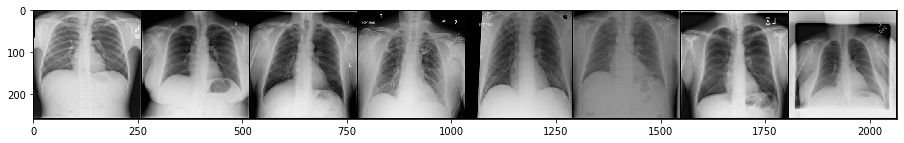

In [8]:
# Test on one a handful of images
# ...<rimshot.wav> :P
for data, _ in build_data_loader(8):
    test_images = data
    break
    
print(test_images.shape)
show_images(test_images)

# Perform Training

In [9]:
# Choose a loss function. Binary Cross Entropy Loss.
compute_loss = nn.BCELoss()

In [10]:
# Specify training details
n_epochs = 100
batch_size = 100

In [11]:
# torch.distributed.init_process_group(backend='nccl')

In [12]:
# Move everything to the GPU for training
gpu = torch.device(0)

G = nn.DataParallel(G)
G = G.to(gpu)

D = nn.DataParallel(D)
D = D.to(gpu)

In [13]:
# Create an optimizer to update the weights of each network
optimizer_d = optim.Adam(D.parameters(), lr=0.0002, betas=(0.5, 0.999))
optimizer_g = optim.Adam(G.parameters(), lr=0.0002, betas=(0.5, 0.999))

In [14]:
data_loader = build_data_loader(batch_size)
test_noise = torch.randn((8, 100, 1, 1)).to(gpu)

Epoch: 0/100
Example images:


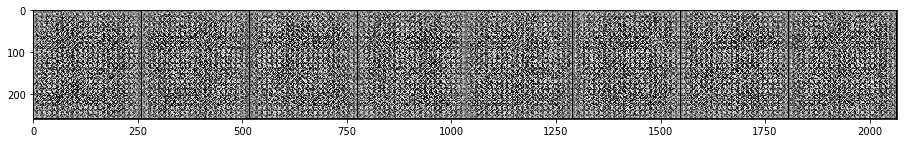

Epoch: 0	Batch: 99/100
Loss G: 7.275835990905762
Loss D: 0.013971501961350441
Epoch: 1/100
Example images:


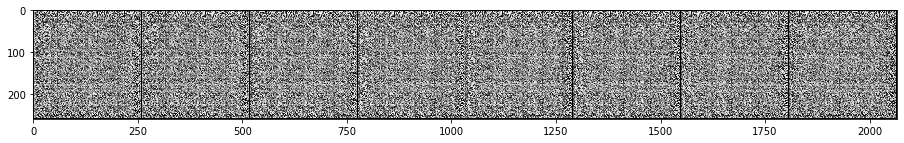

Epoch: 1	Batch: 99/100
Loss G: 10.798166275024414
Loss D: 0.0804404616355896
Epoch: 2/100
Example images:


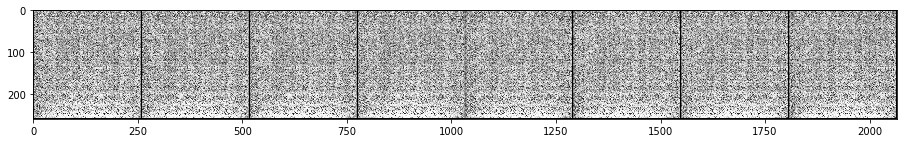

Epoch: 2	Batch: 99/100
Loss G: 3.667090654373169
Loss D: 0.2835344672203064
Epoch: 3/100
Example images:


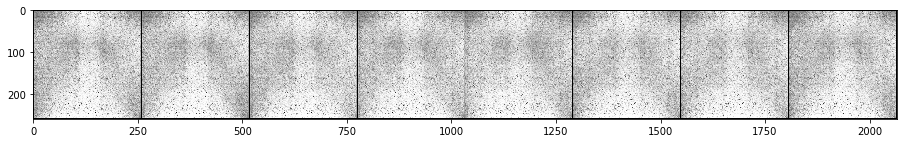

Epoch: 3	Batch: 99/100
Loss G: 1.5151270627975464
Loss D: 0.9703881740570068
Epoch: 4/100
Example images:


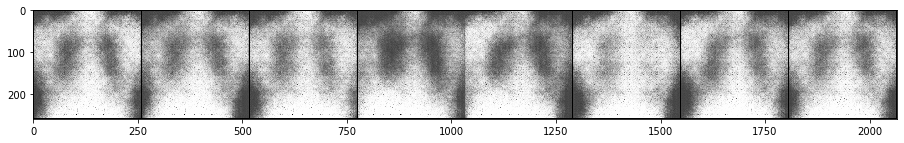

Epoch: 4	Batch: 99/100
Loss G: 1.645396113395691
Loss D: 0.5448810458183289
Epoch: 5/100
Example images:


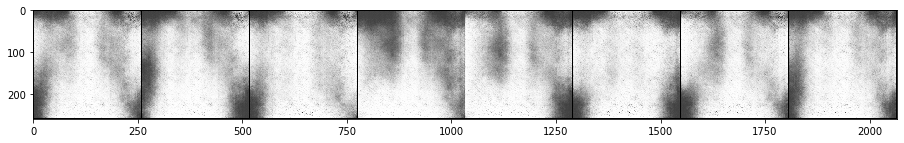

Epoch: 5	Batch: 99/100
Loss G: 1.9361858367919922
Loss D: 0.6411400437355042
Epoch: 6/100
Example images:


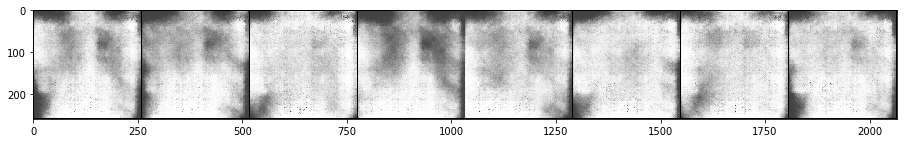

Epoch: 6	Batch: 99/100
Loss G: 0.594124972820282
Loss D: 1.5813013315200806
Epoch: 7/100
Example images:


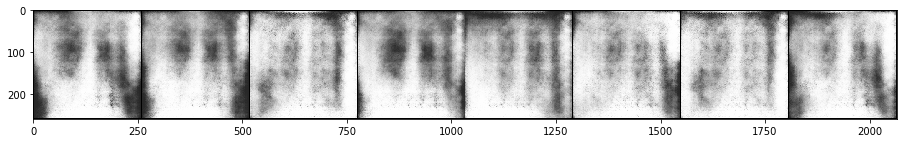

Epoch: 7	Batch: 99/100
Loss G: 7.259007930755615
Loss D: 0.9010447859764099
Epoch: 8/100
Example images:


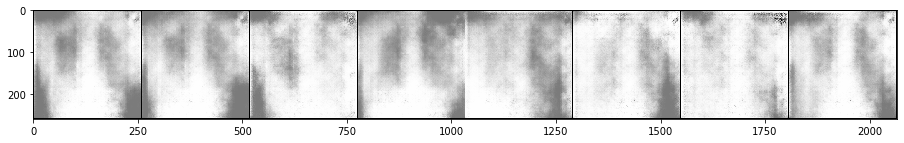

Epoch: 8	Batch: 99/100
Loss G: 3.9928746223449707
Loss D: 0.41009604930877686
Epoch: 9/100
Example images:


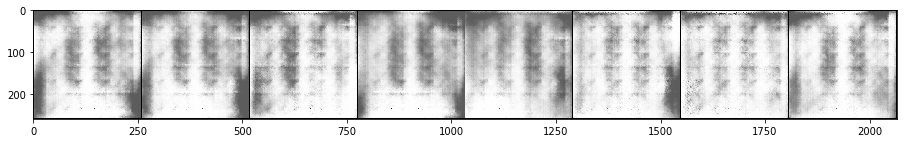

Epoch: 9	Batch: 99/100
Loss G: 1.586808443069458
Loss D: 0.9037198424339294
Epoch: 10/100
Example images:


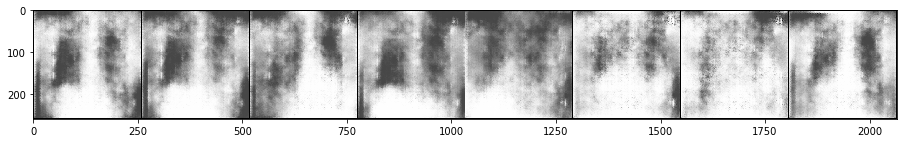

Epoch: 10	Batch: 99/100
Loss G: 5.558218955993652
Loss D: 0.5456657409667969
Epoch: 11/100
Example images:


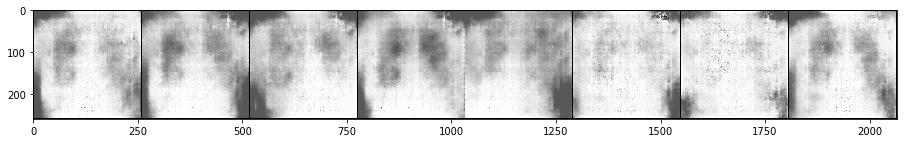

Epoch: 11	Batch: 99/100
Loss G: 4.586801528930664
Loss D: 0.5278983116149902
Epoch: 12/100
Example images:


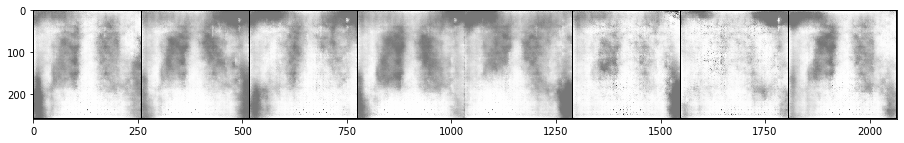

Epoch: 12	Batch: 99/100
Loss G: 4.772390842437744
Loss D: 0.8846367001533508
Epoch: 13/100
Example images:


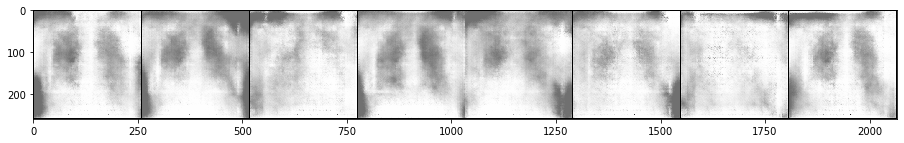

Epoch: 13	Batch: 99/100
Loss G: 4.866413593292236
Loss D: 0.2231961339712143
Epoch: 14/100
Example images:


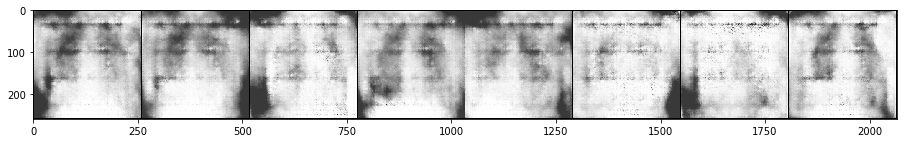

Epoch: 14	Batch: 99/100
Loss G: 4.298867702484131
Loss D: 0.3699406385421753
Epoch: 15/100
Example images:


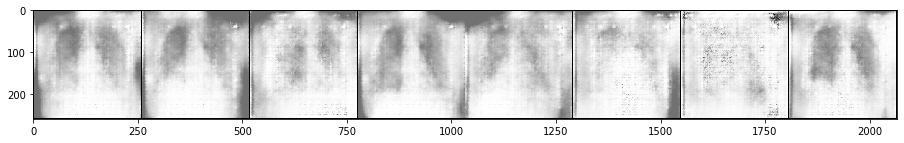

Epoch: 15	Batch: 99/100
Loss G: 4.653121471405029
Loss D: 0.5504125952720642
Epoch: 16/100
Example images:


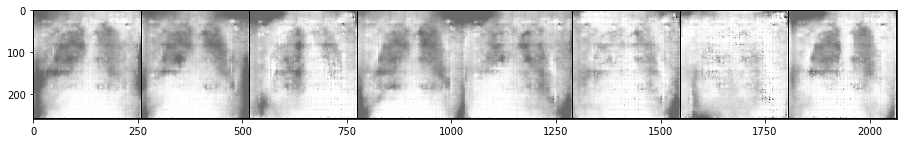

Epoch: 16	Batch: 99/100
Loss G: 2.8664419651031494
Loss D: 0.8564414381980896
Epoch: 17/100
Example images:


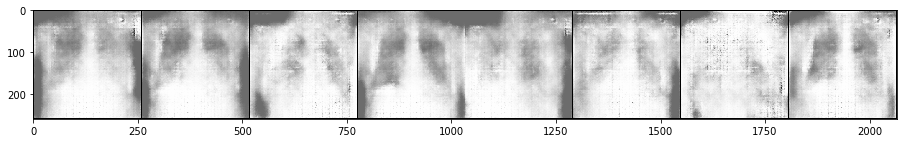

Epoch: 17	Batch: 99/100
Loss G: 8.184309959411621
Loss D: 1.213862657546997
Epoch: 18/100
Example images:


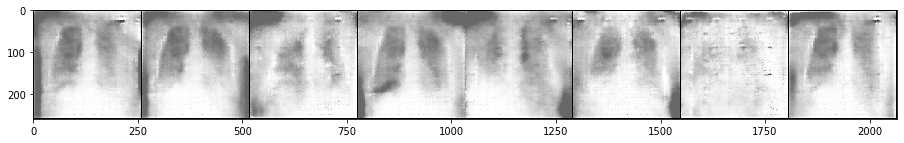

Epoch: 18	Batch: 99/100
Loss G: 3.9293158054351807
Loss D: 0.6805248856544495
Epoch: 19/100
Example images:


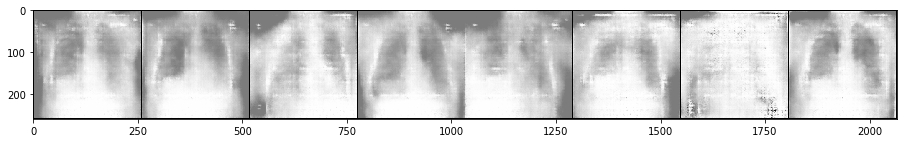

Epoch: 19	Batch: 99/100
Loss G: 3.7346136569976807
Loss D: 0.6247611045837402
Epoch: 20/100
Example images:


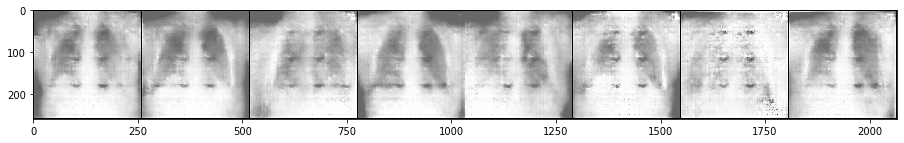

Epoch: 20	Batch: 99/100
Loss G: 6.862663269042969
Loss D: 0.9338608980178833
Epoch: 21/100
Example images:


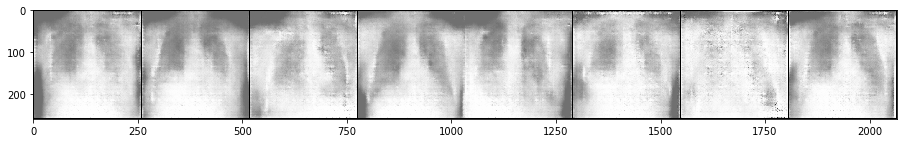

Epoch: 21	Batch: 99/100
Loss G: 4.198946952819824
Loss D: 0.3022347092628479
Epoch: 22/100
Example images:


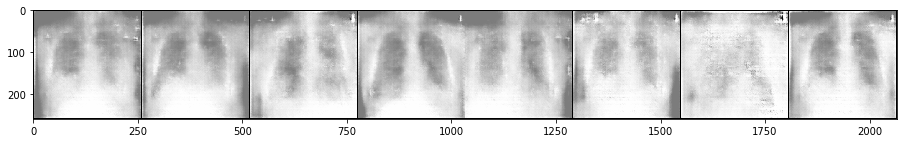

Epoch: 22	Batch: 99/100
Loss G: 4.548449993133545
Loss D: 0.42676228284835815
Epoch: 23/100
Example images:


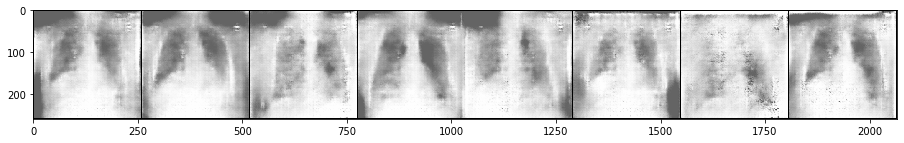

Epoch: 23	Batch: 99/100
Loss G: 5.194865703582764
Loss D: 0.3524393141269684
Epoch: 24/100
Example images:


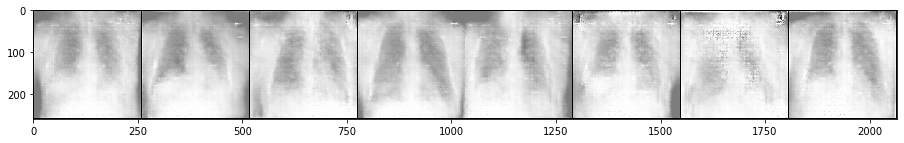

Epoch: 24	Batch: 99/100
Loss G: 8.813314437866211
Loss D: 1.0322065353393555
Epoch: 25/100
Example images:


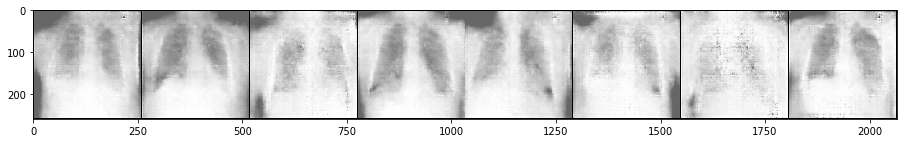

Epoch: 25	Batch: 99/100
Loss G: 6.053739070892334
Loss D: 0.4638321101665497
Epoch: 26/100
Example images:


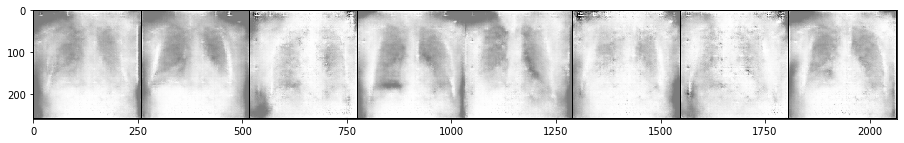

Epoch: 26	Batch: 99/100
Loss G: 4.970876693725586
Loss D: 0.2507859170436859
Epoch: 27/100
Example images:


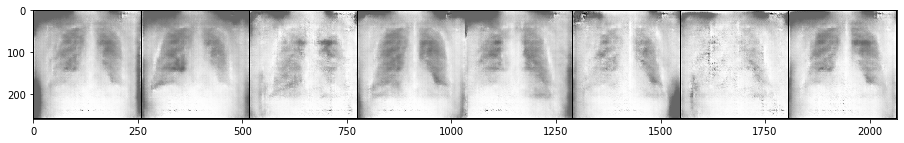

Epoch: 27	Batch: 99/100
Loss G: 3.6496617794036865
Loss D: 0.6131545305252075
Epoch: 28/100
Example images:


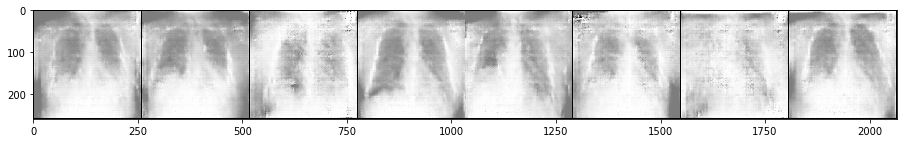

Epoch: 28	Batch: 99/100
Loss G: 5.601660251617432
Loss D: 0.3797943592071533
Epoch: 29/100
Example images:


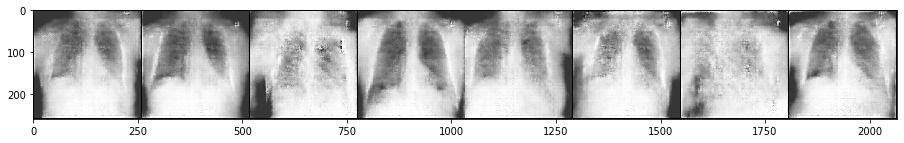

Epoch: 29	Batch: 99/100
Loss G: 3.9931881427764893
Loss D: 0.34192711114883423
Epoch: 30/100
Example images:


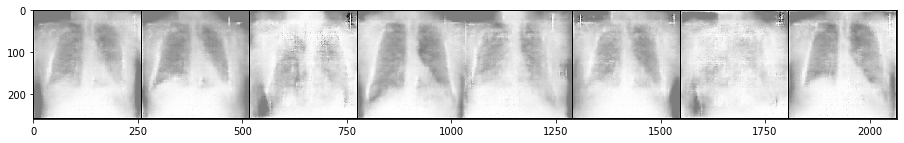

Epoch: 30	Batch: 99/100
Loss G: 4.14691162109375
Loss D: 0.24407343566417694
Epoch: 31/100
Example images:


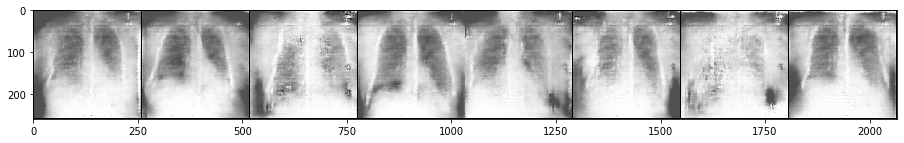

Epoch: 31	Batch: 99/100
Loss G: 5.416849136352539
Loss D: 0.46817418932914734
Epoch: 32/100
Example images:


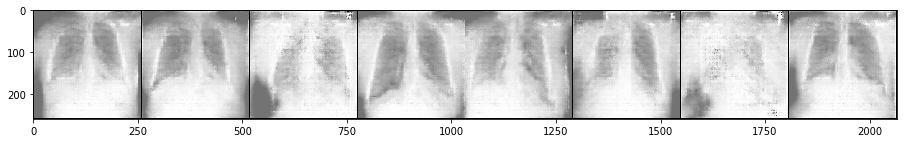

Epoch: 32	Batch: 99/100
Loss G: 3.098039388656616
Loss D: 0.21378356218338013
Epoch: 33/100
Example images:


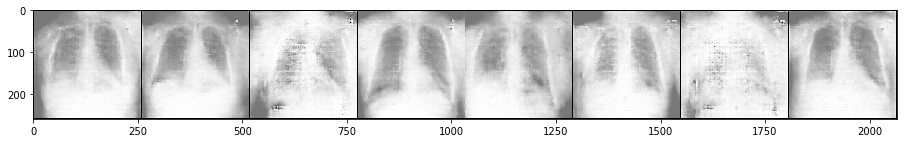

Epoch: 33	Batch: 99/100
Loss G: 4.913235187530518
Loss D: 0.43009766936302185
Epoch: 34/100
Example images:


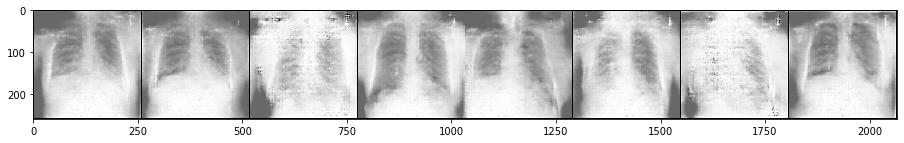

Epoch: 34	Batch: 99/100
Loss G: 3.2419967651367188
Loss D: 0.37992337346076965
Epoch: 35/100
Example images:


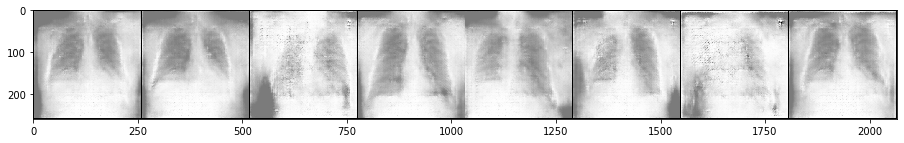

Epoch: 35	Batch: 99/100
Loss G: 5.341485500335693
Loss D: 0.5282960534095764
Epoch: 36/100
Example images:


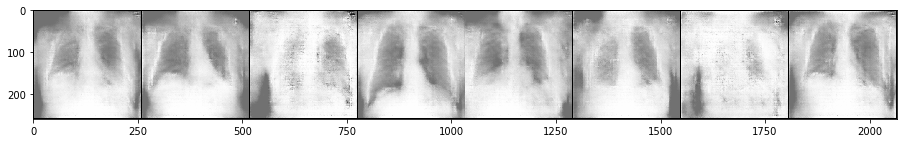

Epoch: 36	Batch: 99/100
Loss G: 3.5729057788848877
Loss D: 0.3132762610912323
Epoch: 37/100
Example images:


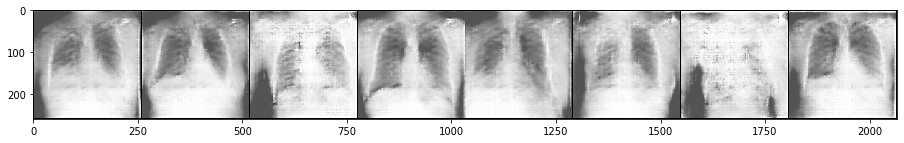

Epoch: 37	Batch: 99/100
Loss G: 3.9864659309387207
Loss D: 0.228147953748703
Epoch: 38/100
Example images:


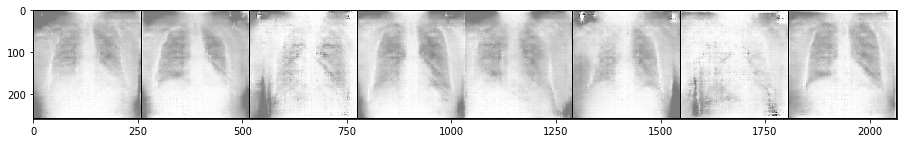

Epoch: 38	Batch: 99/100
Loss G: 3.420133590698242
Loss D: 0.37478306889533997
Epoch: 39/100
Example images:


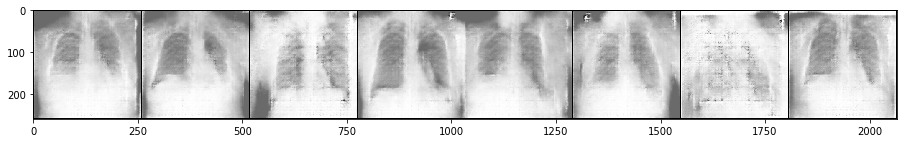

Epoch: 39	Batch: 99/100
Loss G: 5.134940147399902
Loss D: 0.20167352259159088
Epoch: 40/100
Example images:


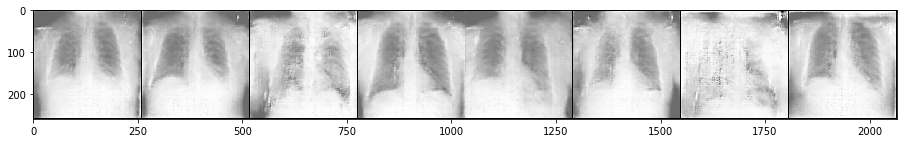

Epoch: 40	Batch: 99/100
Loss G: 6.314562797546387
Loss D: 0.5798928737640381
Epoch: 41/100
Example images:


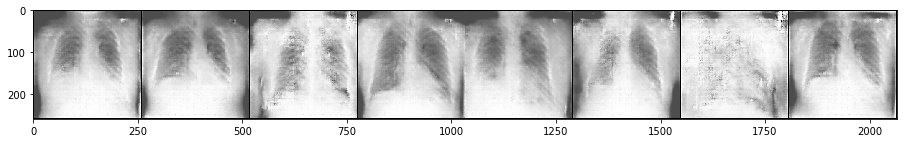

Epoch: 41	Batch: 99/100
Loss G: 2.828747510910034
Loss D: 0.14651447534561157
Epoch: 42/100
Example images:


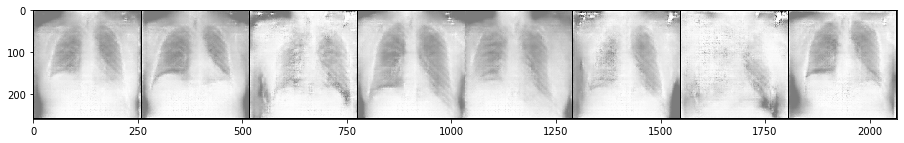

Epoch: 42	Batch: 99/100
Loss G: 5.84340763092041
Loss D: 0.6182215213775635
Epoch: 43/100
Example images:


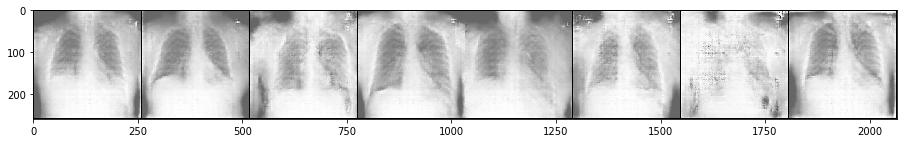

Epoch: 43	Batch: 99/100
Loss G: 5.428994655609131
Loss D: 0.1901695728302002
Epoch: 44/100
Example images:


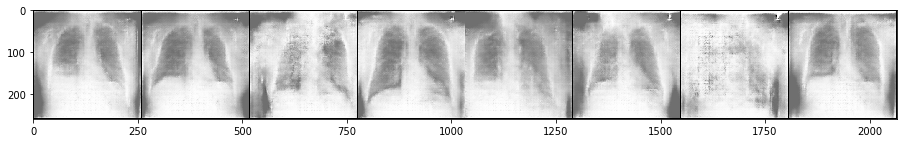

Epoch: 44	Batch: 99/100
Loss G: 4.59162712097168
Loss D: 0.21436753869056702
Epoch: 45/100
Example images:


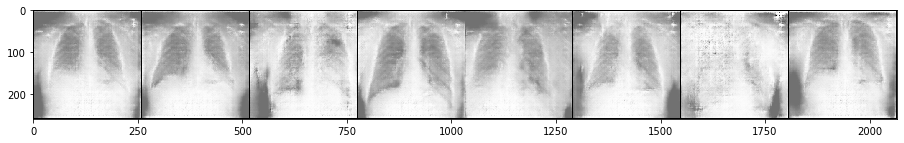

Epoch: 45	Batch: 99/100
Loss G: 5.6849589347839355
Loss D: 0.22760199010372162
Epoch: 46/100
Example images:


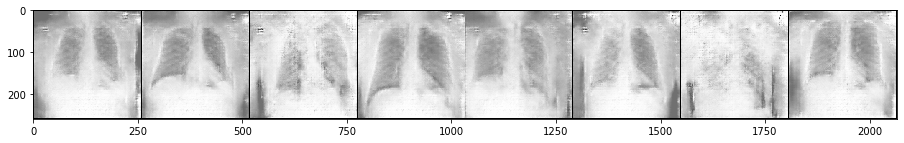

Epoch: 46	Batch: 99/100
Loss G: 5.281196117401123
Loss D: 0.18006743490695953
Epoch: 47/100
Example images:


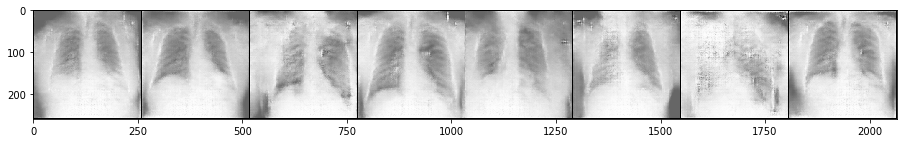

Epoch: 47	Batch: 99/100
Loss G: 5.713160991668701
Loss D: 0.657538890838623
Epoch: 48/100
Example images:


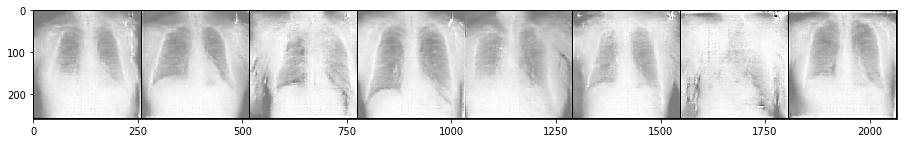

Epoch: 48	Batch: 99/100
Loss G: 6.721645355224609
Loss D: 0.7709474563598633
Epoch: 49/100
Example images:


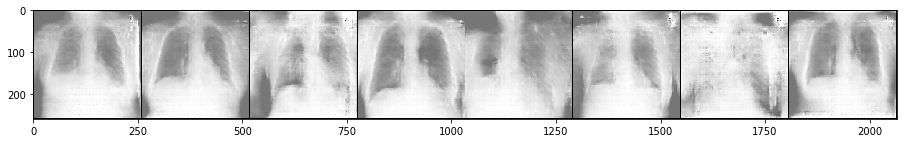

Epoch: 49	Batch: 99/100
Loss G: 5.347416400909424
Loss D: 0.32203587889671326
Epoch: 50/100
Example images:


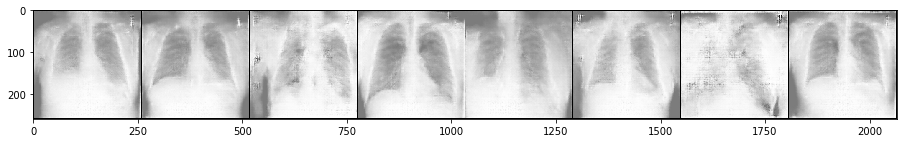

Epoch: 50	Batch: 99/100
Loss G: 5.566338539123535
Loss D: 0.1386246532201767
Epoch: 51/100
Example images:


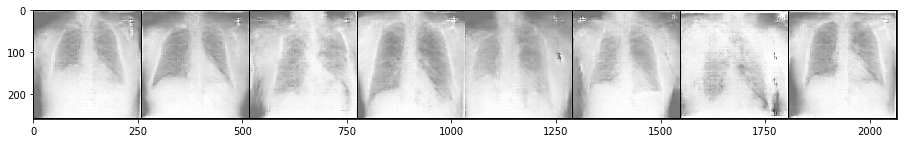

Epoch: 51	Batch: 99/100
Loss G: 4.154057025909424
Loss D: 0.2810550034046173
Epoch: 52/100
Example images:


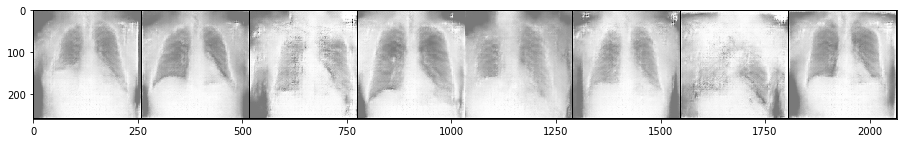

Epoch: 52	Batch: 99/100
Loss G: 4.668486595153809
Loss D: 0.1385391354560852
Epoch: 53/100
Example images:


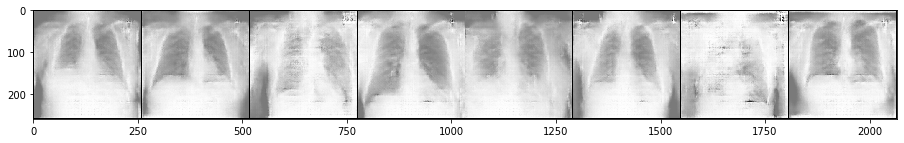

Epoch: 53	Batch: 99/100
Loss G: 5.428074359893799
Loss D: 0.30051812529563904
Epoch: 54/100
Example images:


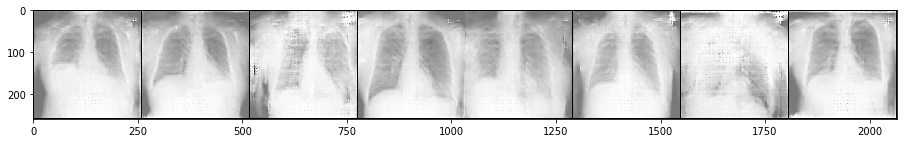

Epoch: 54	Batch: 99/100
Loss G: 4.672957897186279
Loss D: 0.20018431544303894
Epoch: 55/100
Example images:


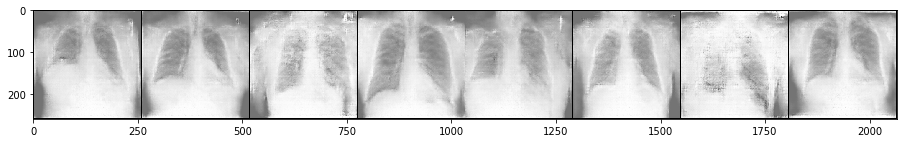

Epoch: 55	Batch: 99/100
Loss G: 5.252513408660889
Loss D: 0.11703358590602875
Epoch: 56/100
Example images:


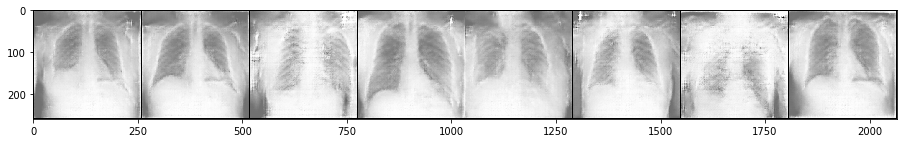

Epoch: 56	Batch: 99/100
Loss G: 8.650375366210938
Loss D: 0.6156774759292603
Epoch: 57/100
Example images:


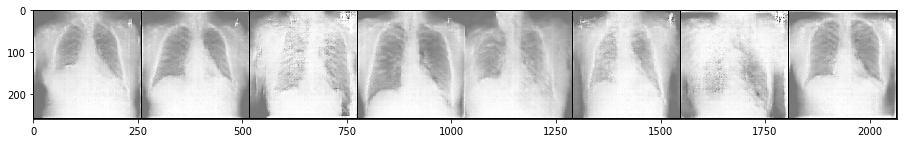

Epoch: 57	Batch: 99/100
Loss G: 4.592058181762695
Loss D: 0.12828020751476288
Epoch: 58/100
Example images:


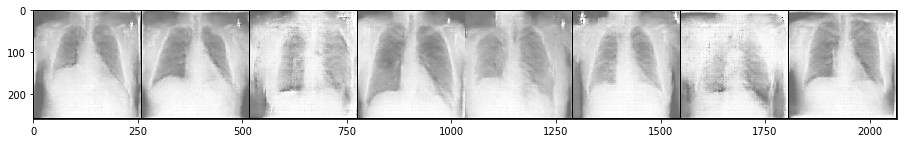

Epoch: 58	Batch: 99/100
Loss G: 5.691917419433594
Loss D: 0.1213950365781784
Epoch: 59/100
Example images:


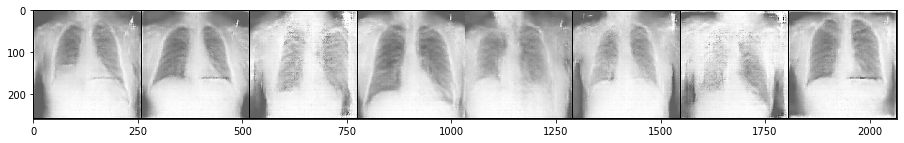

Epoch: 59	Batch: 99/100
Loss G: 5.2407660484313965
Loss D: 0.19786220788955688
Epoch: 60/100
Example images:


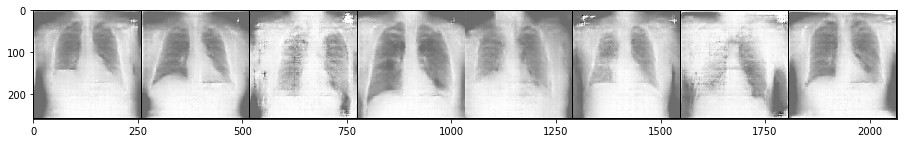

Epoch: 60	Batch: 99/100
Loss G: 8.822908401489258
Loss D: 0.5857420563697815
Epoch: 61/100
Example images:


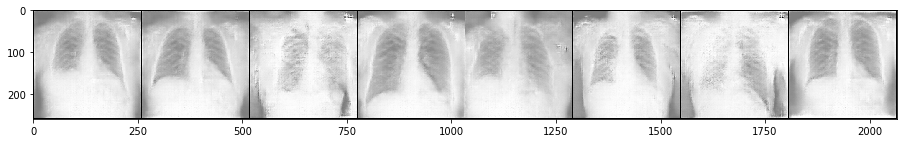

Epoch: 61	Batch: 99/100
Loss G: 5.838451862335205
Loss D: 0.1070086881518364
Epoch: 62/100
Example images:


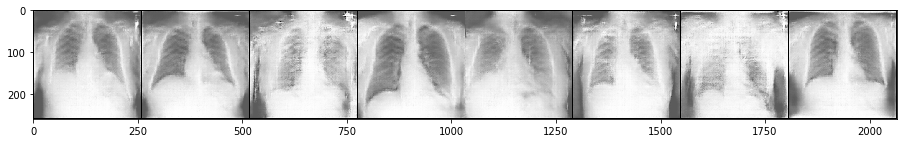

Epoch: 62	Batch: 99/100
Loss G: 2.6603405475616455
Loss D: 0.3884902596473694
Epoch: 63/100
Example images:


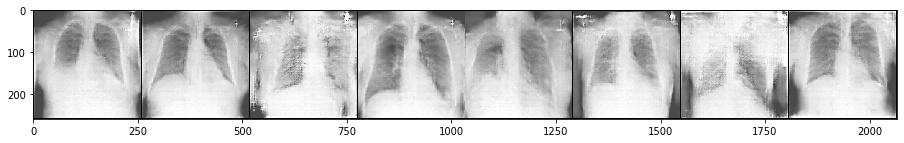

Epoch: 63	Batch: 99/100
Loss G: 3.942338228225708
Loss D: 1.8084144592285156
Epoch: 64/100
Example images:


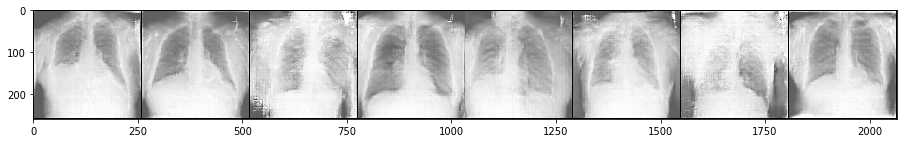

Epoch: 64	Batch: 99/100
Loss G: 4.6064934730529785
Loss D: 0.1983192414045334
Epoch: 65/100
Example images:


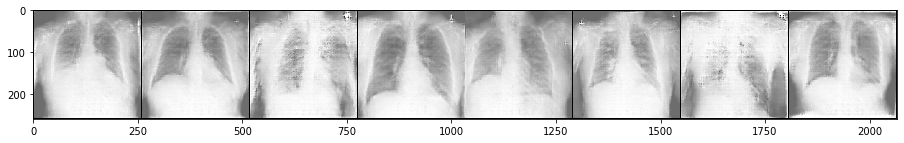

Epoch: 65	Batch: 99/100
Loss G: 3.91172194480896
Loss D: 0.1267608106136322
Epoch: 66/100
Example images:


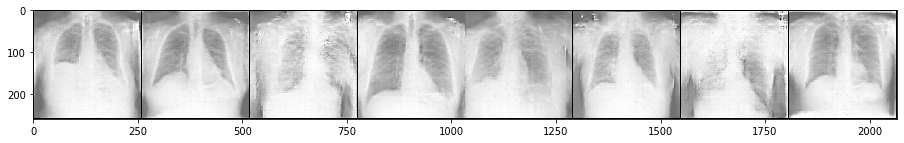

Epoch: 66	Batch: 99/100
Loss G: 4.993830680847168
Loss D: 0.21002715826034546
Epoch: 67/100
Example images:


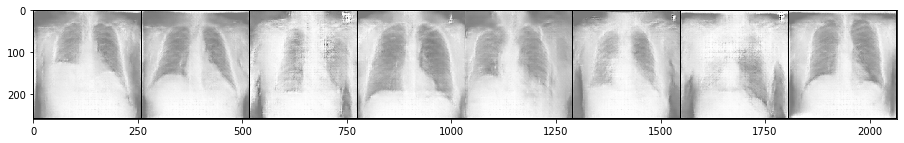

Epoch: 67	Batch: 99/100
Loss G: 3.464275360107422
Loss D: 0.1521025151014328
Epoch: 68/100
Example images:


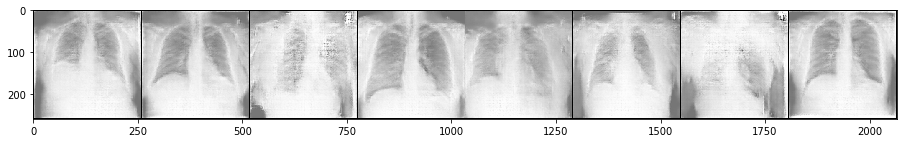

Epoch: 68	Batch: 99/100
Loss G: 7.505713939666748
Loss D: 0.3980700671672821
Epoch: 69/100
Example images:


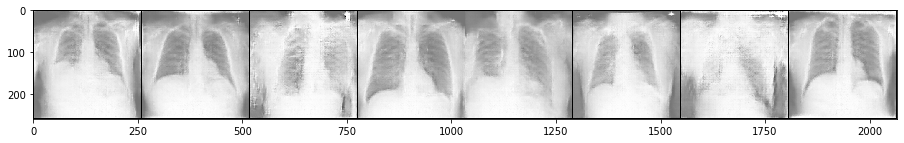

Epoch: 69	Batch: 99/100
Loss G: 5.091146469116211
Loss D: 1.8231866359710693
Epoch: 70/100
Example images:


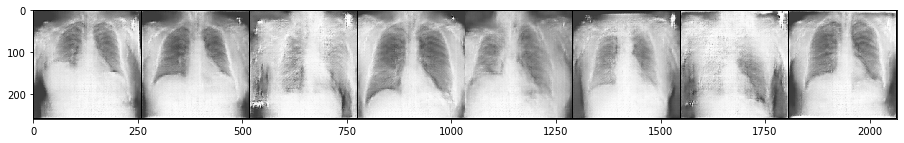

Epoch: 70	Batch: 99/100
Loss G: 3.421668529510498
Loss D: 0.43031418323516846
Epoch: 71/100
Example images:


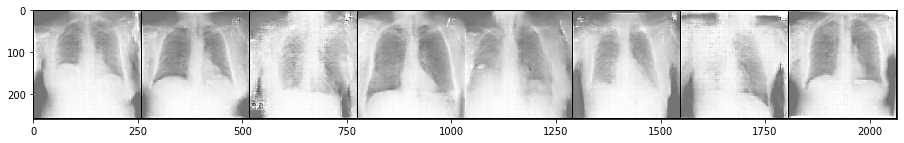

Epoch: 71	Batch: 99/100
Loss G: 4.112451553344727
Loss D: 0.2981906533241272
Epoch: 72/100
Example images:


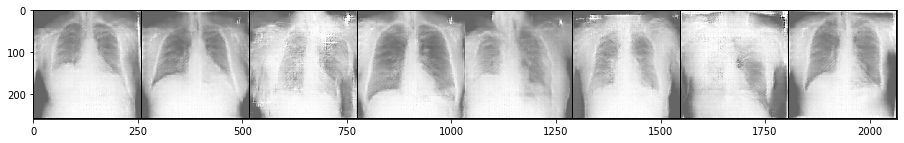

Epoch: 72	Batch: 99/100
Loss G: 5.065626621246338
Loss D: 0.09670378267765045
Epoch: 73/100
Example images:


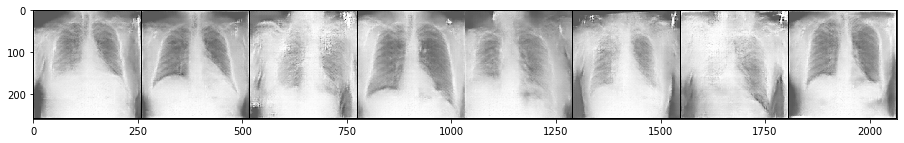

Epoch: 73	Batch: 99/100
Loss G: 6.09548807144165
Loss D: 0.31578758358955383
Epoch: 74/100
Example images:


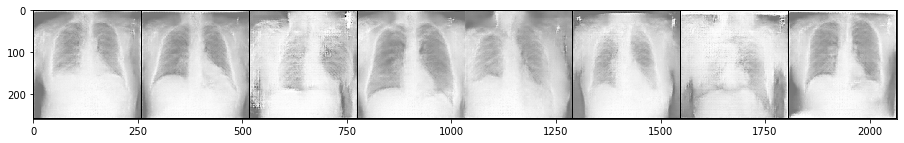

Epoch: 74	Batch: 99/100
Loss G: 4.932492733001709
Loss D: 0.15110504627227783
Epoch: 75/100
Example images:


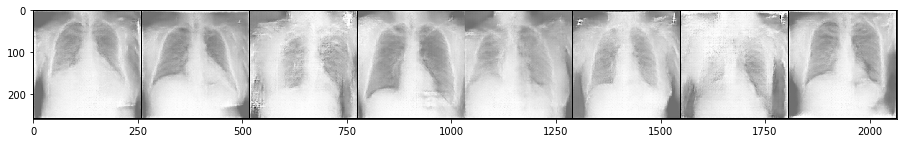

Epoch: 75	Batch: 99/100
Loss G: 4.483344078063965
Loss D: 0.16763368248939514
Epoch: 76/100
Example images:


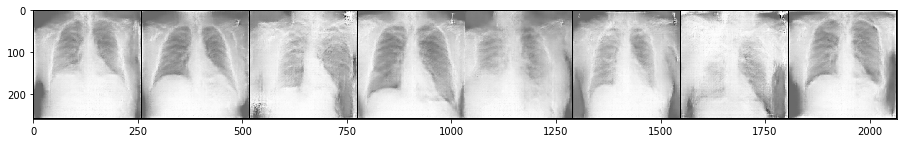

Epoch: 76	Batch: 99/100
Loss G: 3.6887047290802
Loss D: 0.4570421874523163
Epoch: 77/100
Example images:


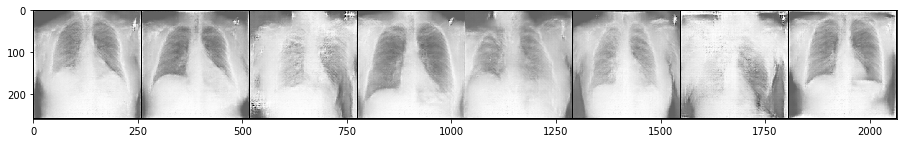

Epoch: 77	Batch: 99/100
Loss G: 4.621983051300049
Loss D: 0.19460445642471313
Epoch: 78/100
Example images:


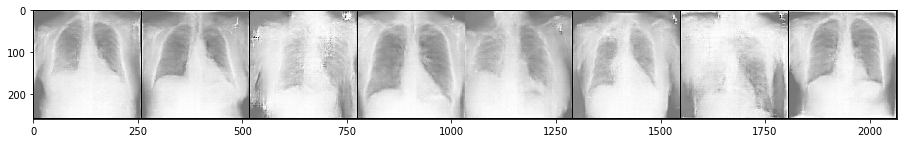

Epoch: 78	Batch: 99/100
Loss G: 5.383660793304443
Loss D: 0.3536263704299927
Epoch: 79/100
Example images:


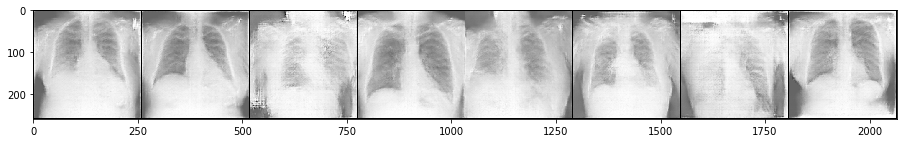

Epoch: 79	Batch: 99/100
Loss G: 4.107334613800049
Loss D: 0.11963991075754166
Epoch: 80/100
Example images:


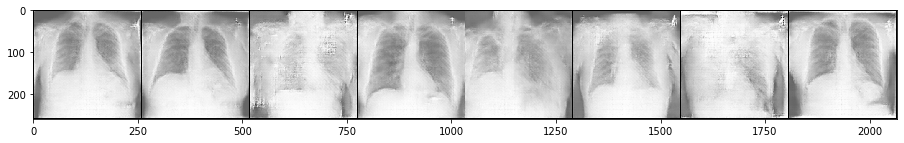

Epoch: 80	Batch: 99/100
Loss G: 7.289832592010498
Loss D: 0.32639214396476746
Epoch: 81/100
Example images:


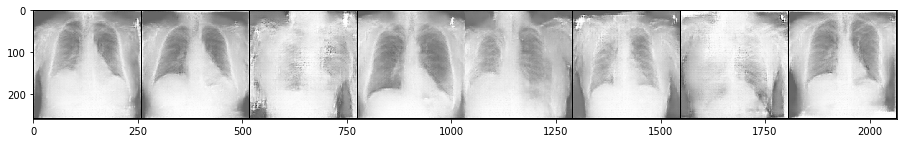

Epoch: 81	Batch: 99/100
Loss G: 3.1129395961761475
Loss D: 0.2754213213920593
Epoch: 82/100
Example images:


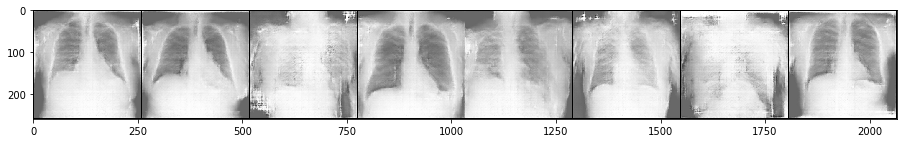

Epoch: 82	Batch: 99/100
Loss G: 4.9956159591674805
Loss D: 0.2509145140647888
Epoch: 83/100
Example images:


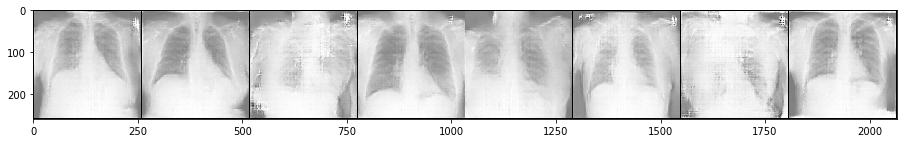

Epoch: 83	Batch: 99/100
Loss G: 4.265411853790283
Loss D: 0.1500028818845749
Epoch: 84/100
Example images:


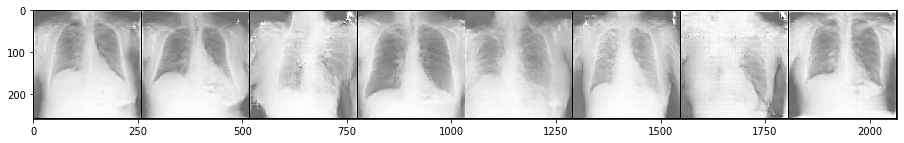

Epoch: 84	Batch: 99/100
Loss G: 3.662790536880493
Loss D: 0.18685975670814514
Epoch: 85/100
Example images:


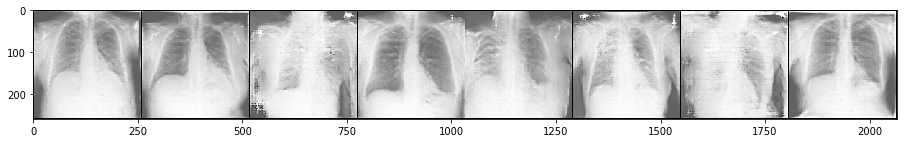

Epoch: 85	Batch: 99/100
Loss G: 5.993149757385254
Loss D: 0.20302876830101013
Epoch: 86/100
Example images:


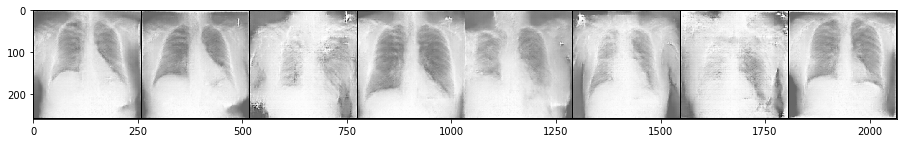

Epoch: 86	Batch: 99/100
Loss G: 4.970759868621826
Loss D: 0.16165713965892792
Epoch: 87/100
Example images:


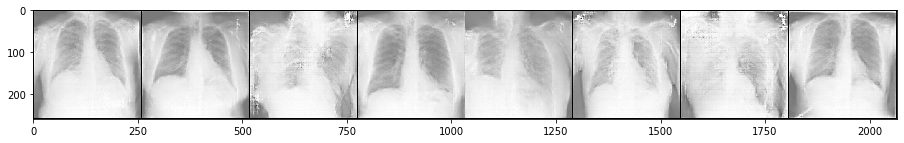

Epoch: 87	Batch: 99/100
Loss G: 7.7407450675964355
Loss D: 0.25123336911201477
Epoch: 88/100
Example images:


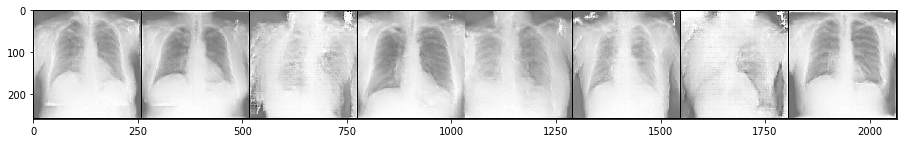

Epoch: 88	Batch: 99/100
Loss G: 4.688276767730713
Loss D: 0.47176414728164673
Epoch: 89/100
Example images:


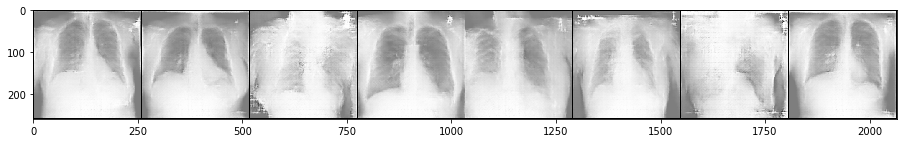

Epoch: 89	Batch: 99/100
Loss G: 5.024085998535156
Loss D: 0.24293841421604156
Epoch: 90/100
Example images:


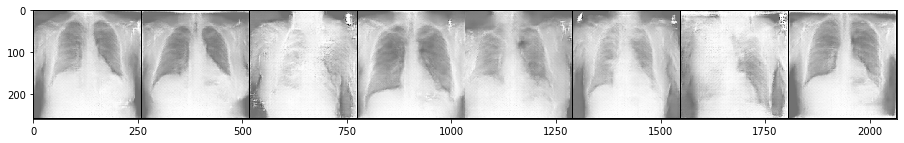

Epoch: 90	Batch: 99/100
Loss G: 3.1899490356445312
Loss D: 0.34464243054389954
Epoch: 91/100
Example images:


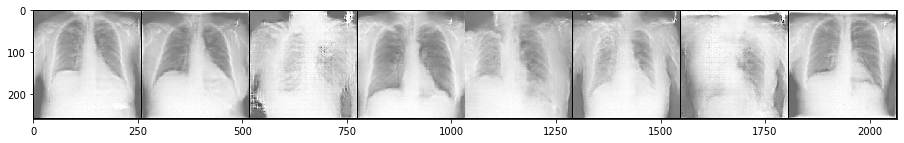

Epoch: 91	Batch: 99/100
Loss G: 2.988582134246826
Loss D: 0.942087709903717
Epoch: 92/100
Example images:


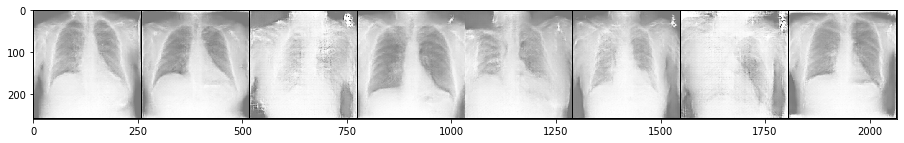

Epoch: 92	Batch: 99/100
Loss G: 6.012515068054199
Loss D: 0.5920974016189575
Epoch: 93/100
Example images:


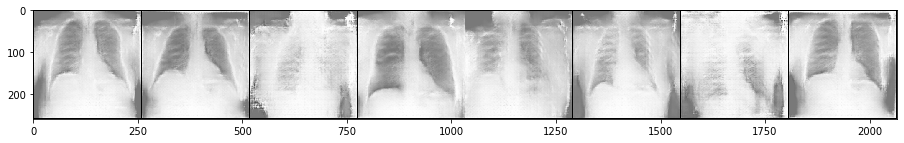

Epoch: 93	Batch: 99/100
Loss G: 4.300411224365234
Loss D: 0.18323716521263123
Epoch: 94/100
Example images:


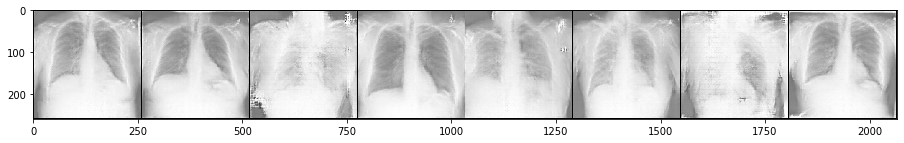

Epoch: 94	Batch: 99/100
Loss G: 4.6989874839782715
Loss D: 0.18610849976539612
Epoch: 95/100
Example images:


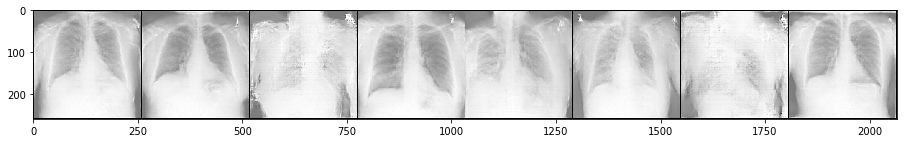

Epoch: 95	Batch: 99/100
Loss G: 6.915594100952148
Loss D: 0.4683738648891449
Epoch: 96/100
Example images:


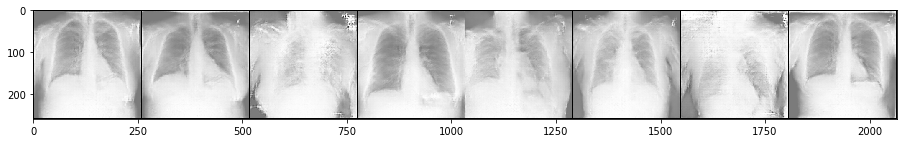

Epoch: 96	Batch: 99/100
Loss G: 3.6953282356262207
Loss D: 0.18538454174995422
Epoch: 97/100
Example images:


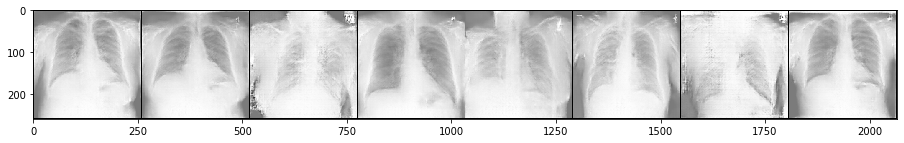

Epoch: 97	Batch: 99/100
Loss G: 4.477410316467285
Loss D: 0.2391737997531891
Epoch: 98/100
Example images:


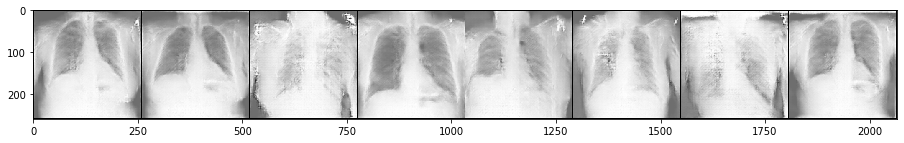

Epoch: 98	Batch: 99/100
Loss G: 3.679612636566162
Loss D: 0.23883840441703796
Epoch: 99/100
Example images:


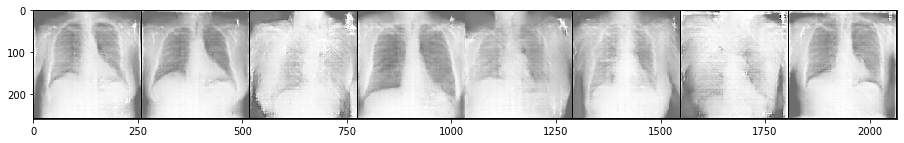

Epoch: 99	Batch: 99/100
Loss G: 5.854594707489014
Loss D: 0.17803896963596344


In [15]:
for epoch in range(n_epochs):
    print(f"Epoch: {epoch}/{n_epochs}")
    print("Example images:")
    generated_images = G(test_noise).detach().cpu()
    show_images(generated_images)
    
    for i, (batch, _) in enumerate(data_loader):
        print(f"\rEpoch: {epoch}\tBatch: {i}/{len(data_loader)}", end='')
        ## Train the discriminiator ##
        D.zero_grad()

        # Compute error on real data
        real = Variable(batch).to(gpu)
        real_labels = Variable(torch.ones(real.size(0), 1, 1, 1)).to(gpu)
        real_predictions = D(real)
        
        d_error_real = compute_loss(real_predictions, real_labels)
        
        # Compute error on fake data
        noise = Variable(torch.randn(real.size(0), 100, 1, 1)).to(gpu)
        fake = G(noise)
        fake_predictions = D(fake.detach())
        fake_labels = Variable(torch.zeros(real.size(0), 1, 1, 1)).to(gpu)
        d_error_fake = compute_loss(fake_predictions, fake_labels)
        
        # Accumulate and backpropogate on combined error
        d_error_total = d_error_real + d_error_fake
        d_error_total.backward()
        optimizer_d.step()
        
        ## Train the generator ##
        G.zero_grad()
        
        # Compute rate of fakes being detected
        goal_labels = Variable(torch.ones(real.size(0), 1, 1, 1)).to(gpu)
        results = D(fake)
        g_error = compute_loss(results, goal_labels)
        
        # Backpropogate and update weights
        g_error.backward()
        optimizer_g.step()
    
    print("")
    print(f"Loss G: {g_error}")
    print(f"Loss D: {d_error_total}")

In [15]:
torch.save(G.state_dict(), "/home/seif.younis/Deep Learning and Medical Imaging/examples/Toy GAN/trained models/trained_generator")
torch.save(D.state_dict(), "/home/seif.younis/Deep Learning and Medical Imaging/examples/Toy GAN/trained models/trained_discriminator")